# **The Storm Of the Century: Temperature Advection ERA5**
***

In [1]:
import xarray as xr
import pandas as pd
import numpy as np
from datetime import datetime as dt
from metpy.units import units
import metpy.calc as mpcalc
from scipy import ndimage  
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib as mpl
import metpy
from metpy.plots import ctables
from matplotlib.colors import LinearSegmentedColormap

## **Date Input**

In [2]:
startYear = 1993
startMonth = 3
startDay = 7
startHour = 0
startMinute = 0
startDateTime = dt(startYear,startMonth,startDay, startHour, startMinute)

endYear = 1993
endMonth = 3
endDay = 15
endHour = 0
endMinute = 0
endDateTime = dt(endYear,endMonth,endDay, endHour, endMinute)

In [3]:
dateList = pd.date_range(startDateTime, endDateTime,freq="6H")
dateList

/tmp/ipykernel_51270/666960345.py:1: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  dateList = pd.date_range(startDateTime, endDateTime,freq="6H")


DatetimeIndex(['1993-03-07 00:00:00', '1993-03-07 06:00:00',
               '1993-03-07 12:00:00', '1993-03-07 18:00:00',
               '1993-03-08 00:00:00', '1993-03-08 06:00:00',
               '1993-03-08 12:00:00', '1993-03-08 18:00:00',
               '1993-03-09 00:00:00', '1993-03-09 06:00:00',
               '1993-03-09 12:00:00', '1993-03-09 18:00:00',
               '1993-03-10 00:00:00', '1993-03-10 06:00:00',
               '1993-03-10 12:00:00', '1993-03-10 18:00:00',
               '1993-03-11 00:00:00', '1993-03-11 06:00:00',
               '1993-03-11 12:00:00', '1993-03-11 18:00:00',
               '1993-03-12 00:00:00', '1993-03-12 06:00:00',
               '1993-03-12 12:00:00', '1993-03-12 18:00:00',
               '1993-03-13 00:00:00', '1993-03-13 06:00:00',
               '1993-03-13 12:00:00', '1993-03-13 18:00:00',
               '1993-03-14 00:00:00', '1993-03-14 06:00:00',
               '1993-03-14 12:00:00', '1993-03-14 18:00:00',
               '1993-03-

## **ERA5**

In [4]:
reanalysis = xr.open_zarr(
    'gs://gcp-public-data-arco-era5/ar/1959-2022-full_37-1h-0p25deg-chunk-1.zarr-v2', 
    consolidated=True
)

## **Area and Domain**

In [5]:
lonW = -99 + 360
lonE = -59 + 360
latS = 20
latN = 50
inc=.25
cLat, cLon = (latS + latN)/2, (lonW + lonE)/2
latRange = np.arange(latN,latS-inc,-inc) # expand the data range a bit beyond the plot range
lonRange = np.arange(lonW,lonE+inc,+inc) # Need to match longitude values to those of the coordinate variable
constrainLat, constrainLon = (0.6, 7)
proj_map = ccrs.LambertConformal(central_longitude=cLon, central_latitude=cLat)
proj_data = ccrs.PlateCarree() # Our data is lat-lon; thus its native projection is Plate Carree.
res = '50m'

## **Variables**

In [6]:
plevel=700

V = reanalysis['v_component_of_wind'].sel(time=dateList,level=plevel,latitude=latRange,longitude=lonRange)
U = reanalysis['u_component_of_wind'].sel(time=dateList,level=plevel,latitude=latRange,longitude=lonRange)
T = reanalysis['temperature'].sel(time=dateList,level=plevel,latitude=latRange,longitude=lonRange)

In [7]:
lats = T.latitude
lons = T.longitude

## **MetPy Calculations**

In [8]:
Ums = U.metpy.convert_units('m/s')
Vms = V.metpy.convert_units('m/s')
T=T.metpy.convert_units('degF')

In [ ]:
# Temperature Advection
tadv = mpcalc.advection(T, Ums, Vms)

/tmp/ipykernel_51270/3882468261.py:2: UserWarning: Vertical dimension number not found. Defaulting to (..., Z, Y, X) order.
  tadv = mpcalc.advection(T, Ums, Vms)


In [ ]:
kelvin_to_fahrenheit = 9 / 5  # Conversion factor for K to °F
seconds_to_hours = 3600       # Conversion factor for seconds to hours

In [ ]:
temperature_adv_f_per_s = tadv * kelvin_to_fahrenheit

# Convert from °F/s to °F/hr
temperature_adv_f_per_hr = temperature_adv_f_per_s * seconds_to_hours
tadv=temperature_adv_f_per_hr

In [12]:
tadv = tadv.compute()

## **Graphing**

In [13]:
tadv.min(),tadv.max()

(<xarray.DataArray 'neg-190580cd9094c6f9a12209629c7b55bb' ()> Size: 8B
 <Quantity(-28.9899533, 'kelvin / second')>
 Coordinates:
     level    int64 8B 700,
 <xarray.DataArray 'neg-190580cd9094c6f9a12209629c7b55bb' ()> Size: 8B
 <Quantity(51.9465053, 'kelvin / second')>
 Coordinates:
     level    int64 8B 700)

In [14]:
contour_int = 1
contourf_int = .5
negtadvContours = np.arange (-30, -1, contourf_int)
postadvContours = np.arange (1, 52, contour_int)
advContours = np.arange (-30,52,contourf_int)

In [15]:
postadvContours

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51])

In [16]:
#def segment_cmap(cmap_name, start, end):
    #cmap = plt.get_cmap(cmap_name)
    #colors = cmap(np.linspace(start, end))
    #return LinearSegmentedColormap.from_list(f"{cmap_name}_segment_{start}_{end}", colors)



In [17]:
#segment_cmap = segment_cmap('RdPu', 0.4, 1)

In [18]:
cmap1='Blues_r'
cmap2='Reds'
bounds = np.arange(0, 60, 5)
ticks = bounds


In [19]:
frnt=tadv.fillna(0)

Processing 1993-03-07 00:00:00
Processing 1993-03-07 06:00:00
Processing 1993-03-07 12:00:00
Processing 1993-03-07 18:00:00
Processing 1993-03-08 00:00:00
Processing 1993-03-08 06:00:00
Processing 1993-03-08 12:00:00
Processing 1993-03-08 18:00:00
Processing 1993-03-09 00:00:00
Processing 1993-03-09 06:00:00
Processing 1993-03-09 12:00:00
Processing 1993-03-09 18:00:00
Processing 1993-03-10 00:00:00
Processing 1993-03-10 06:00:00
Processing 1993-03-10 12:00:00
Processing 1993-03-10 18:00:00
Processing 1993-03-11 00:00:00
Processing 1993-03-11 06:00:00
Processing 1993-03-11 12:00:00
Processing 1993-03-11 18:00:00
Processing 1993-03-12 00:00:00


/tmp/ipykernel_51270/3336270699.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(22,14)) # Increase size to adjust for the constrained lats/lons


Processing 1993-03-12 06:00:00
Processing 1993-03-12 12:00:00
Processing 1993-03-12 18:00:00
Processing 1993-03-13 00:00:00
Processing 1993-03-13 06:00:00
Processing 1993-03-13 12:00:00
Processing 1993-03-13 18:00:00
Processing 1993-03-14 00:00:00
Processing 1993-03-14 06:00:00
Processing 1993-03-14 12:00:00
Processing 1993-03-14 18:00:00
Processing 1993-03-15 00:00:00


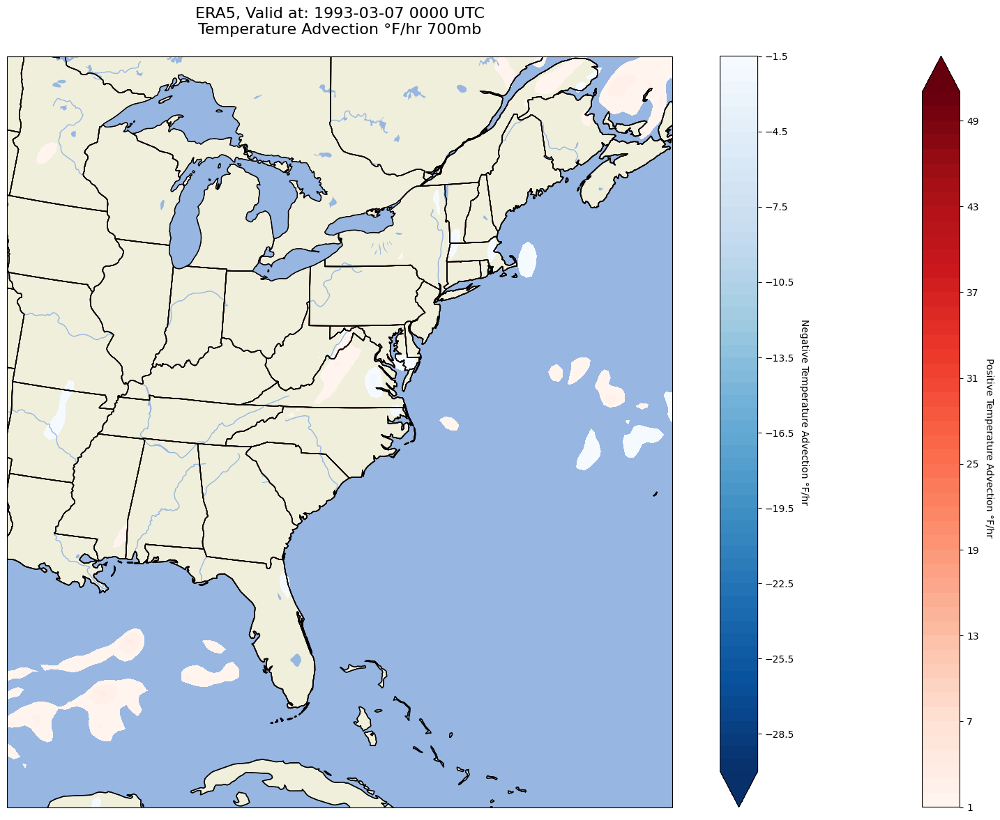

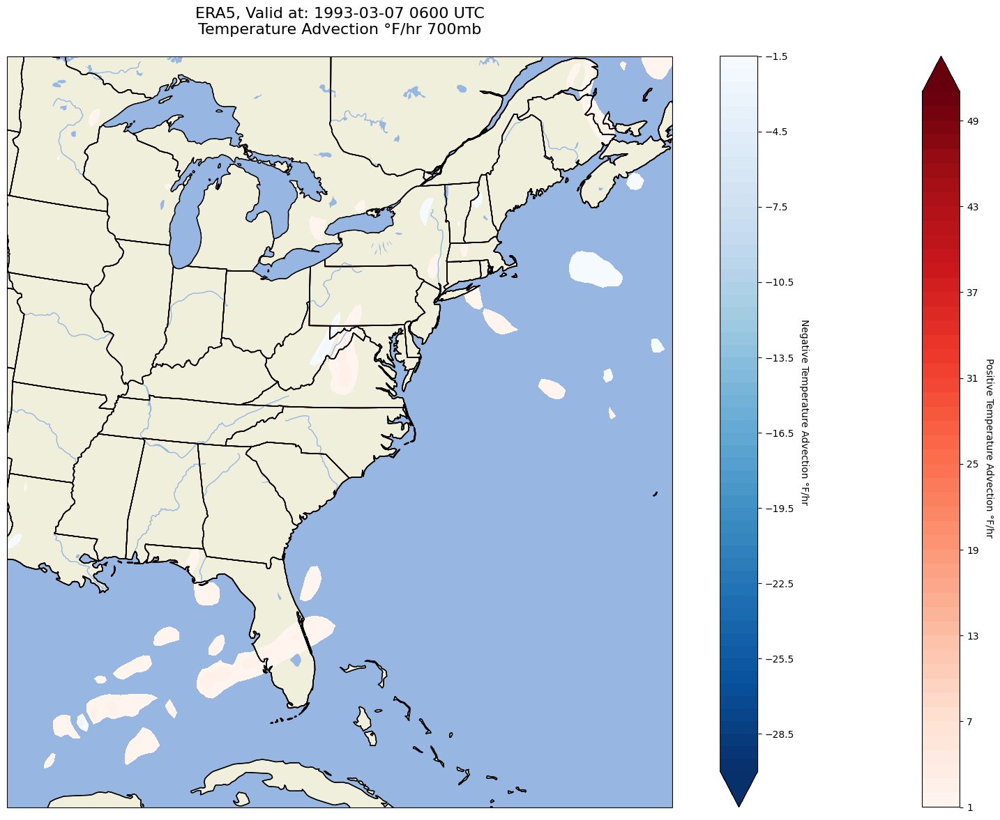

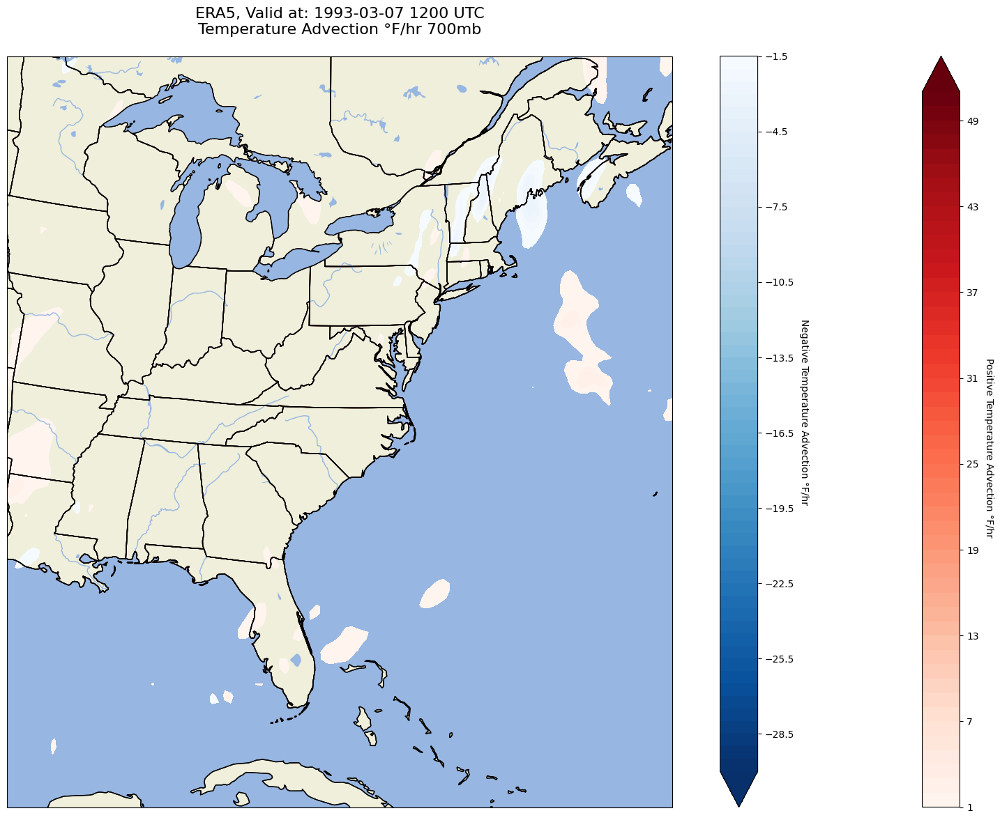

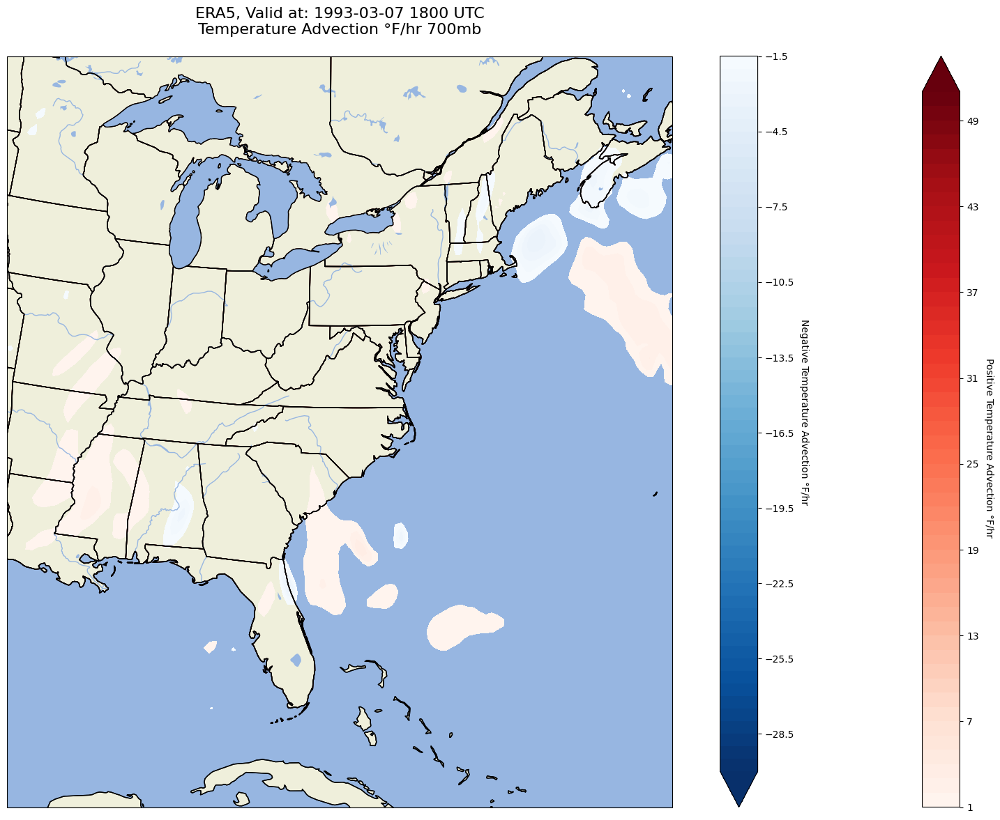

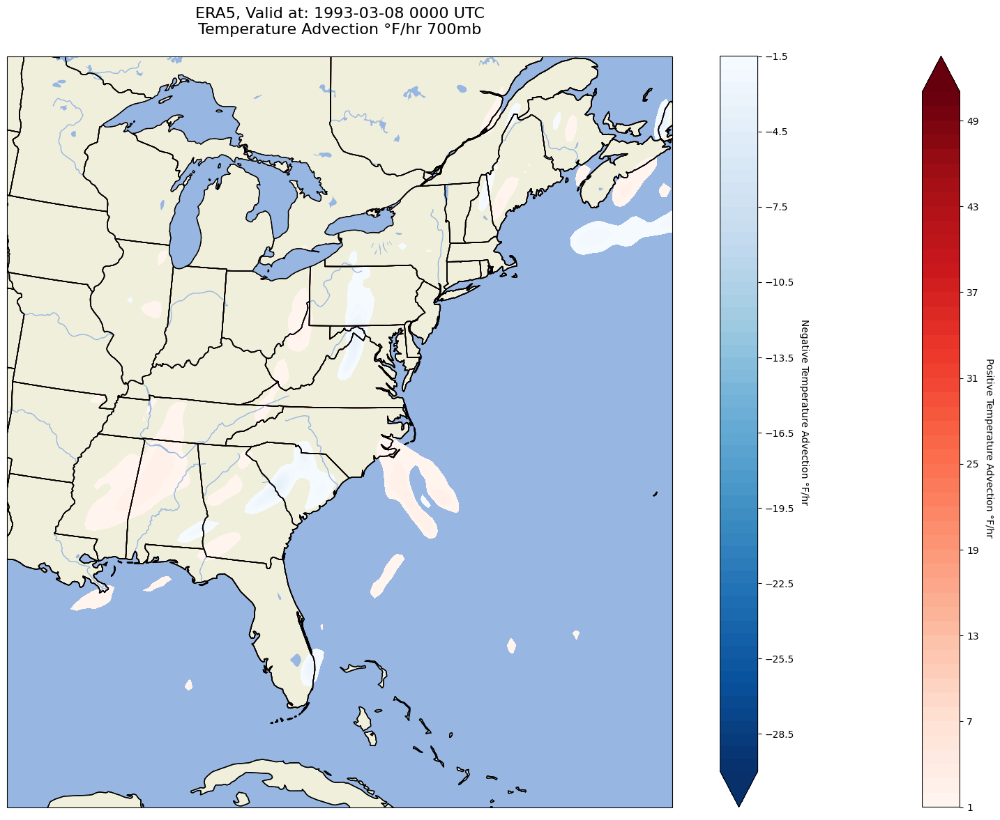

...

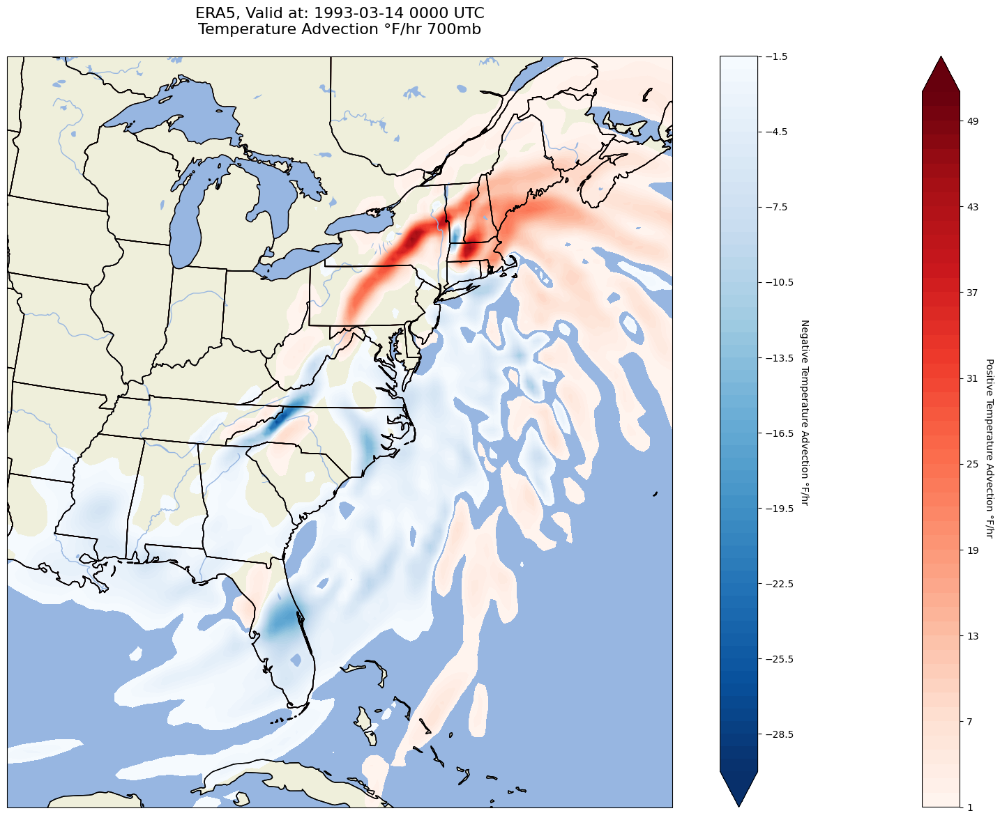

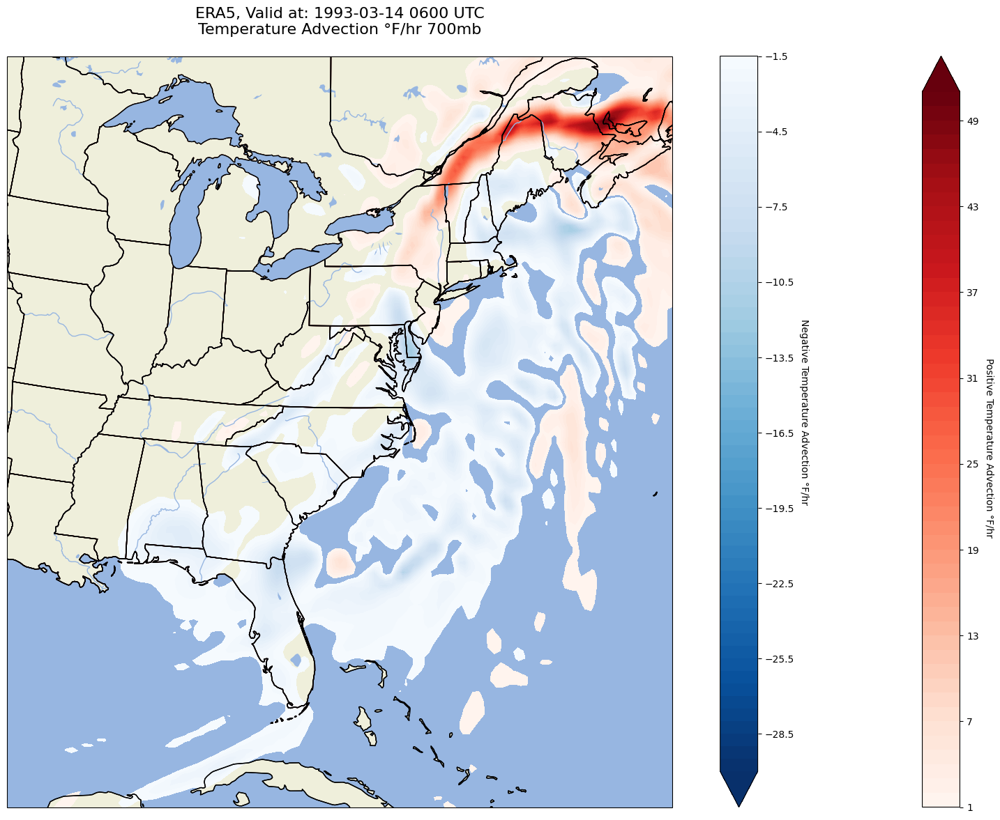

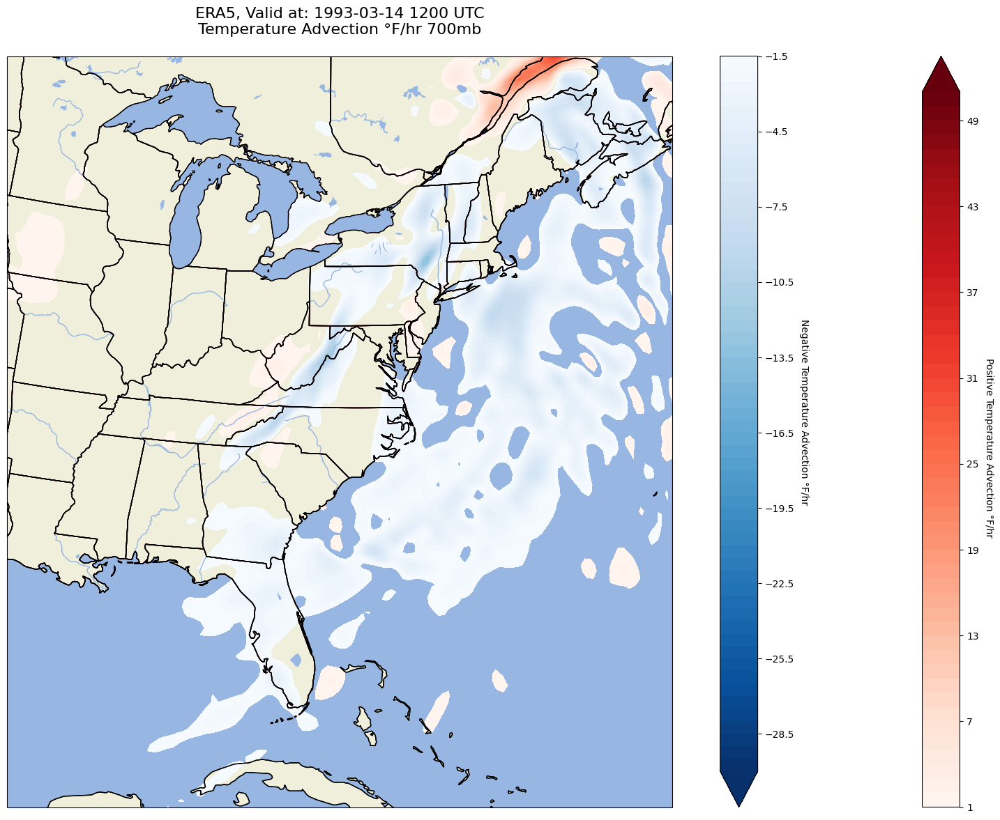

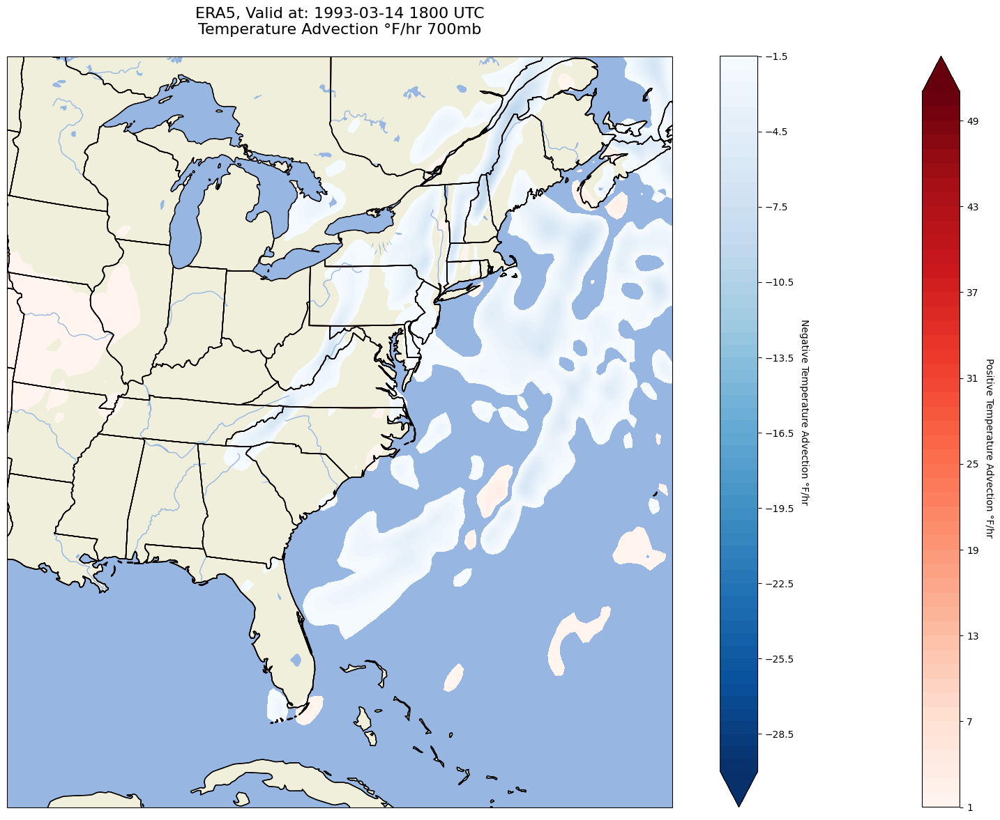

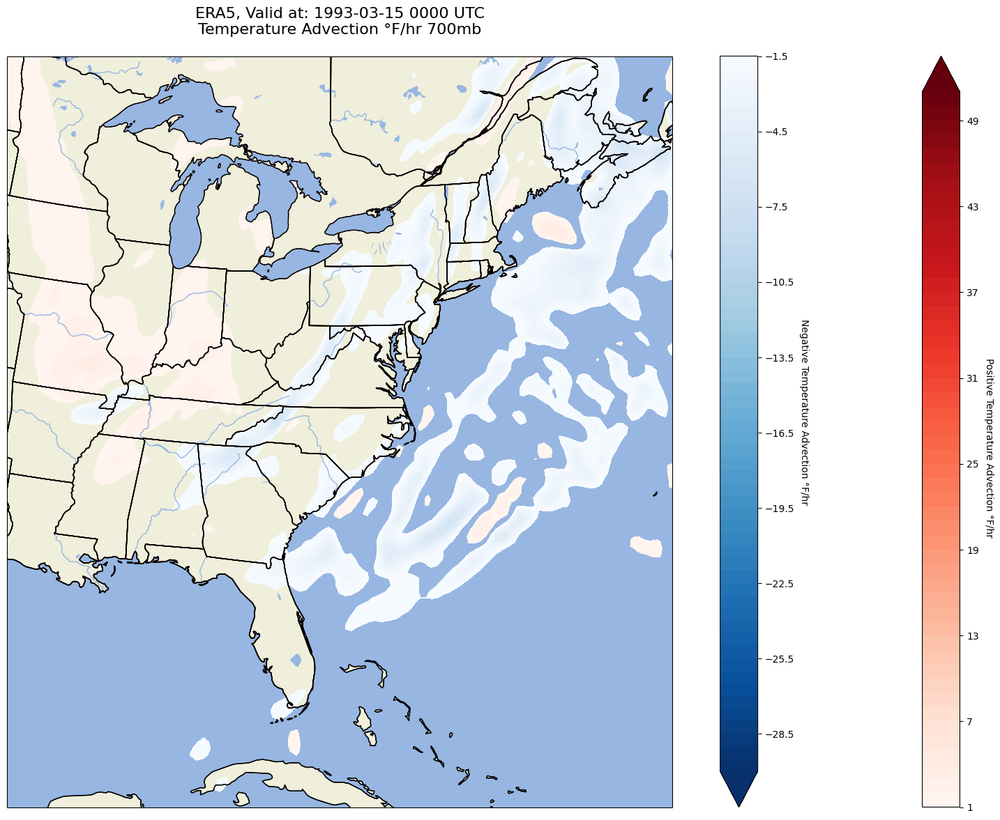

In [20]:
for time in dateList:
    print("Processing", time)
    
    # Create the time strings, for the figure title as well as for the file name.
    timeStr = dt.strftime(time,format="%Y-%m-%d %H%M UTC")
    timeStrFile = dt.strftime(time,format="%Y%m%d%H")
    levstr=f'{plevel}'
    
    tl1 = str('ERA5, Valid at: '+ timeStr)
    tl2 = ("Temperature Advection °F/hr " + levstr + "mb")
    
    title_line = (tl1 + '\n' + tl2 + '\n')
    
    fig = plt.figure(figsize=(22,14)) # Increase size to adjust for the constrained lats/lons
    ax = plt.subplot(1,1,1,projection=proj_map)
    ax.set_extent ([lonW+constrainLon,lonE-constrainLon,latS+constrainLat,latN-constrainLat])
    ax.add_feature(cfeature.COASTLINE.with_scale(res))
    ax.add_feature(cfeature.STATES.with_scale(res),edgecolor='brown')
    ax.add_feature (cfeature.STATES.with_scale(res))
    ax.add_feature (cfeature.RIVERS.with_scale(res))
    ax.add_feature (cfeature.LAND.with_scale(res))
    ax.add_feature (cfeature.COASTLINE.with_scale(res))
    ax.add_feature (cfeature.LAKES.with_scale(res))
    ax.add_feature (cfeature.STATES.with_scale(res))
    ax.add_feature(cfeature.OCEAN)
    
 
   
    #cPosTAdv = ax.contour(lons, lats, tadv.sel(time=time), levels=postadvContours, colors='red', linewidths=3, transform=proj_data)
    #ax.clabel(cPosTAdv, inline=1, fontsize=12, fmt='%.0f')
    
    
    #cNegTAdv = ax.contour(lons, lats, tadv.sel(time=time), levels=negtadvContours, colors='blue', linewidths=3, transform=proj_data)
    #ax.clabel(cNegTAdv, inline=1, fontsize=12, fmt='%.0f')
    
    contourf1=ax.contourf(lons,lats,tadv.sel(time=time),levels=postadvContours,cmap=cmap2,transform=proj_data,extend='max')
    contourf2=ax.contourf(lons,lats,tadv.sel(time=time),levels=negtadvContours,cmap=cmap1,transform=proj_data,extend='min')
    
    cbar1 = plt.colorbar(contourf1, ax=ax)
    cbar1.set_label('Positive Temperature Advection °F/hr ', rotation=270, labelpad=15)
    cbar2 = plt.colorbar(contourf2, ax=ax)
    cbar2.set_label('Negative Temperature Advection °F/hr ', rotation=270, labelpad=15)
    
    # Wind barbs
    #skip = 4
    #ax.barbs(lons[::skip],lats[::skip],UKts.sel(time=time)[::skip,::skip].values, VKts.sel(time=time)[::skip,::skip].values, color='black',zorder=2,transform=proj_data)

    title = plt.title(title_line,fontsize=16)